# Import necessary libs

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 89.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [2]:
import ultralytics
ultralytics.checks()

import os
import numpy as np
import timm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torchvision import models
from torchvision import transforms
from PIL import Image

from ultralytics import YOLO

Ultralytics 8.3.82 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 35.5/112.6 GB disk)


# Load previous models

## Text Detection

### Download model weights

In [3]:
!wget -O best.pt https://github.com/qhung23125005/Scene-Text-Detection/raw/03d0a674738ee110686cad3ce132e7bd47cd89e1/runs/content/runs/detect/train/weights/best.pt

--2025-03-04 16:08:39--  https://github.com/qhung23125005/Scene-Text-Detection/raw/03d0a674738ee110686cad3ce132e7bd47cd89e1/runs/content/runs/detect/train/weights/best.pt
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/qhung23125005/Scene-Text-Detection/03d0a674738ee110686cad3ce132e7bd47cd89e1/runs/content/runs/detect/train/weights/best.pt [following]
--2025-03-04 16:08:39--  https://media.githubusercontent.com/media/qhung23125005/Scene-Text-Detection/03d0a674738ee110686cad3ce132e7bd47cd89e1/runs/content/runs/detect/train/weights/best.pt
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 O

### Load model

In [4]:
text_det_model_path = 'best.pt'
yolo = YOLO(text_det_model_path)

## Text Recognition

### Download weights

In [5]:
!wget -O ocr_crnn.pt https://github.com/qhung23125005/Scene-Text-Detection/raw/e629a8d550f68c334d0ec8e70702b1fa6c773d0d/ocr_crnn.pt

--2025-03-04 16:08:43--  https://github.com/qhung23125005/Scene-Text-Detection/raw/e629a8d550f68c334d0ec8e70702b1fa6c773d0d/ocr_crnn.pt
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/qhung23125005/Scene-Text-Detection/e629a8d550f68c334d0ec8e70702b1fa6c773d0d/ocr_crnn.pt [following]
--2025-03-04 16:08:43--  https://media.githubusercontent.com/media/qhung23125005/Scene-Text-Detection/e629a8d550f68c334d0ec8e70702b1fa6c773d0d/ocr_crnn.pt
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 100585047 (96M) [application/octet-stream]
Saving to: ‘ocr_crnn.pt’

ocr_crnn.pt         100%[=

### Reconstruct the model

In [6]:
class CRNN(nn.Module):
    def __init__(self, vocab_size, hidden_size, n_layers,
                 dropout=0.2, unfreeze_layers=3):
        super(CRNN, self).__init__()
        backbone = timm.create_model("resnet34", in_chans=1, pretrained=True)
        modules = list(backbone.children())[:-2]
        modules.append(nn.AdaptiveAvgPool2d((1,None)))
        self.backbone = nn.Sequential(*modules)

        # Unfreeze the last few layers
        for param in self.backbone[-unfreeze_layers:].parameters():
            param.requires_grad = True

        self.mapSeq = nn.Sequential(
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.gru = nn.GRU(
            512,
            hidden_size,
            n_layers,
            batch_first=True,
            bidirectional=True,
            dropout = dropout if n_layers > 1 else 0
        )
        self.layernorm = nn.LayerNorm(hidden_size * 2)

        self.out = nn.Sequential(
            nn.Linear(hidden_size * 2, vocab_size),
            nn.LogSoftmax(dim=2)
        )

    def forward(self, x):
        x = self.backbone(x)
        x = x.permute(0, 3, 1, 2)
        x = x.view(x.size(0), x.size(1), -1)
        x = self.mapSeq(x)
        x, _ = self.gru(x)
        x = self.layernorm(x)
        x = self.out(x)
        x = x.permute(1, 0, 2)
        return x

In [7]:
chars = '0123456789abcdefghijklmnopqrstuvwxyz-'
vocab_size = len(chars)
char_to_idx = {char: idx+1 for idx, char in enumerate(sorted(chars))}
idx_to_char = {idx: char for char, idx in char_to_idx.items()}

hidden_size = 256
n_layers = 3
dropout_prob = 0.2
unfreeze_layers = 3
device = "cuda" if torch.cuda.is_available() else "cpu"
model_path = 'ocr_crnn.pt'

crnn_model = CRNN(
    vocab_size=vocab_size,
    hidden_size=hidden_size,
    n_layers=n_layers,
    dropout=dropout_prob,
    unfreeze_layers=unfreeze_layers,
).to(device)
crnn_model.load_state_dict(torch.load(model_path))

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

<All keys matched successfully>

# Inferencing

## Build sequence decoder

In [18]:
def decode(encoded_sequences, idx_to_char, blank_char="-"):
    decoded_sequences = []
    for seq in encoded_sequences:
        decoded_label = []
        prev_char = None  # To track the previous character

        for token in seq:
            if token != 0:  # Ignore padding (token = 0)
                char = idx_to_char[token.item()]
                # Append the character if it's not a blank or the same as the previous character
                if char != blank_char:
                    if char != prev_char or prev_char == blank_char:
                        decoded_label.append(char)
                prev_char = char  # Update previous character

        decoded_sequences.append("".join(decoded_label))

    return decoded_sequences

## Build text dectection

In [9]:
def text_detection(img_path, text_det_model):
    text_det_results = text_det_model(img_path, verbose = False)[0]

    bboxes = text_det_results.boxes.xyxy.tolist()
    classes = text_det_results.boxes.cls.tolist()
    names = text_det_results.names
    confs = text_det_results.boxes.conf.tolist()

    return bboxes, classes, names, confs

## Build text recogniton

In [10]:
data_transforms = {
    "train": transforms.Compose(
        [
            transforms.Resize((100, 420)),
            transforms.ColorJitter(
                brightness=0.5,
                contrast=0.5,
                saturation=0.5,
            ),
            transforms.Grayscale(
                num_output_channels=1,
            ),
            transforms.GaussianBlur(3),
            transforms.RandomAffine(
                degrees=1,
                shear=1,
            ),
            transforms.RandomPerspective(
                distortion_scale=0.3,
                p=0.5,
                interpolation=3,
            ),
            transforms.RandomRotation(degrees=2),
            transforms.ToTensor(),
            transforms.Normalize((0.5,), (0.5,)),
        ]
    ),
    "val": transforms.Compose(
        [
            transforms.Resize((100, 420)),
            transforms.Grayscale(num_output_channels=1),
            transforms.ToTensor(),
            transforms.Normalize((0.5,), (0.5,)),
        ]
    ),
}

In [19]:
def text_recognition(img, data_transforms, text_reg_model, idx_to_char, device):
    transformed_image = data_transforms(img)
    transformed_image = transformed_image.unsqueeze(0)
    transformed_image = transformed_image.to(device)
    text_reg_model.eval()
    with torch.no_grad():
        output = text_reg_model(transformed_image).detach().cpu()
    text = decode(output.permute(1, 0, 2).argmax(2), idx_to_char)
    return text

## Build results viualizer

In [12]:
def visualize_detections(img, detections):
    plt.figure(figsize=(12,8))
    plt.imshow(img)
    plt.axis('off')

    for bbox, detected_class, confidence, transcribed_text in detections:
        x1 , y1 , x2 , y2 = bbox
        plt.gca().add_patch(
            plt.Rectangle(
                (x1, y1),
                x2-x1,
                y2-y1,
                fill=False,
                edgecolor='red',
                linewidth=2
            )
        )
        plt.text(
            x1, y1 - 10,
            f"{detected_class} ({confidence:.2f}): {transcribed_text}",
            fontsize=9,
            bbox=dict(facecolor='red', alpha=0.5)
        )
    plt.show()

## Build predict function

In [13]:
def predict(img_path, data_transforms, text_det_model, text_reg_model,
            idx_to_char, device):
    # Detection
    bboxes, classes, names, confs = text_detection(img_path, text_det_model)

    # Load the image
    img = Image.open(img_path)

    # Recognition
    detections = []
    for bbox, cls, conf in zip(bboxes, classes, confs):
        x1, y1, x2, y2 = bbox
        confidence = conf
        detected_class = cls
        name = names[int(cls)]

        # Extract the image
        cropped_img = img.crop((x1, y1, x2, y2))

        transcribed_text = text_recognition(
            cropped_img, data_transforms,
            text_reg_model, idx_to_char,
            device
        )
        detections.append((bbox, name, confidence, transcribed_text))

    visualize_detections(img, detections)

# Testing

## Download data

In [14]:
!gdown 1kUy2tuH-kKBlFCNA0a9sqD2TG4uyvBnV

Downloading...
From (original): https://drive.google.com/uc?id=1kUy2tuH-kKBlFCNA0a9sqD2TG4uyvBnV
From (redirected): https://drive.google.com/uc?id=1kUy2tuH-kKBlFCNA0a9sqD2TG4uyvBnV&confirm=t&uuid=c8d9778c-c46d-41b7-961f-0494d4e444e6
To: /content/icdar2003.zip
100% 45.7M/45.7M [00:00<00:00, 195MB/s]


In [15]:
!unzip icdar2003.zip

Archive:  icdar2003.zip
   creating: SceneTrialTrain/apanar_06.08.2002/
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1247.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1252.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1253.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1255.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1259.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1261.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1263.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1265.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1269.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1281.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1282.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1283.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1284.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1285.JPG  
  inflating: SceneTrialTrain/apanar_06.08.2002/IMG_1286.JPG 

## Test an image

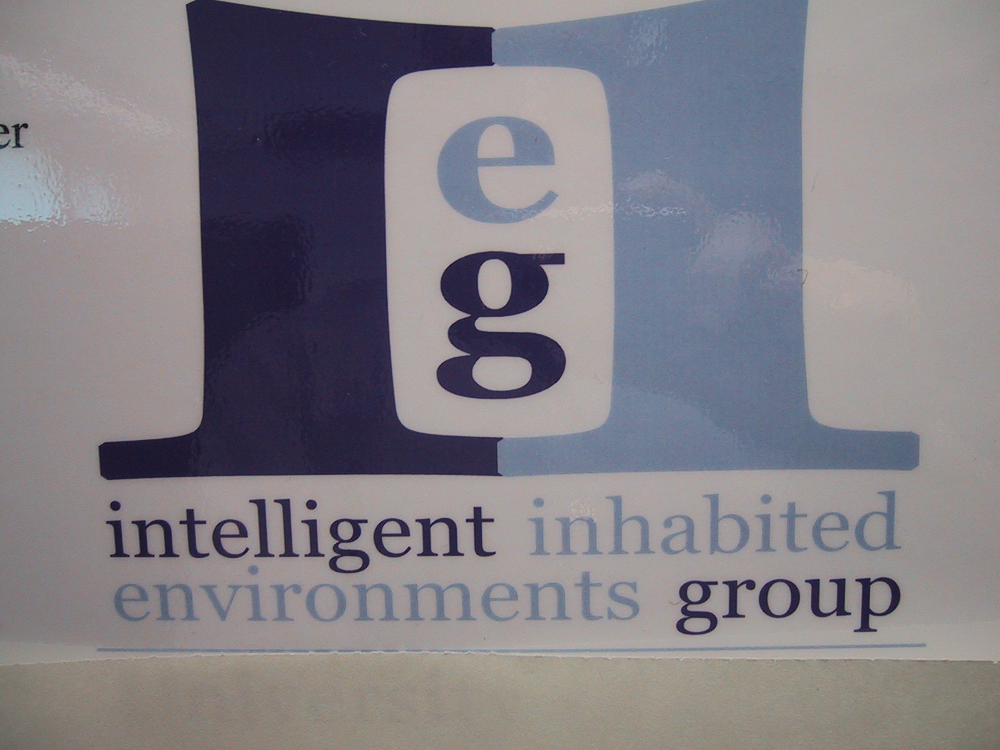

In [16]:
img_path = 'SceneTrialTrain/apanar_06.08.2002/IMG_1247.JPG'
img = Image.open(img_path)

img

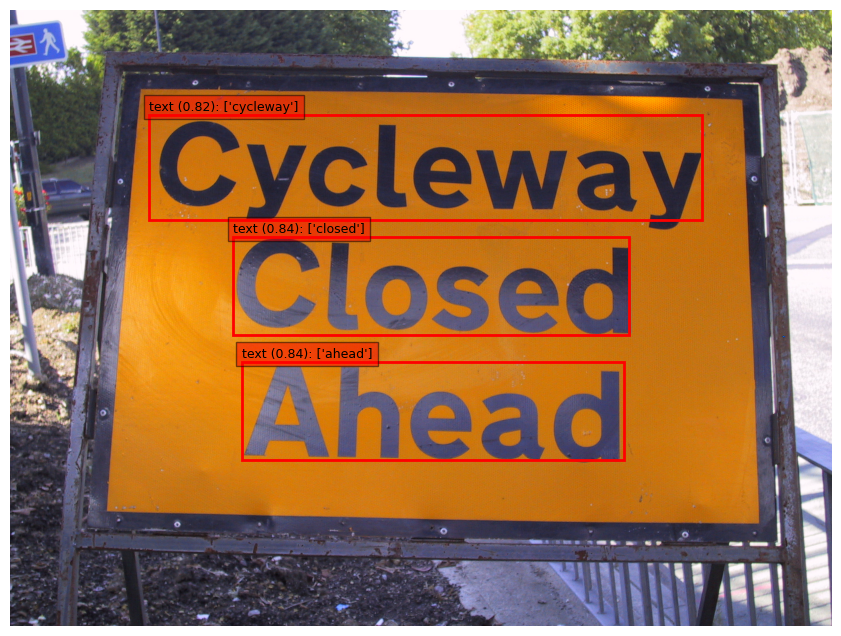

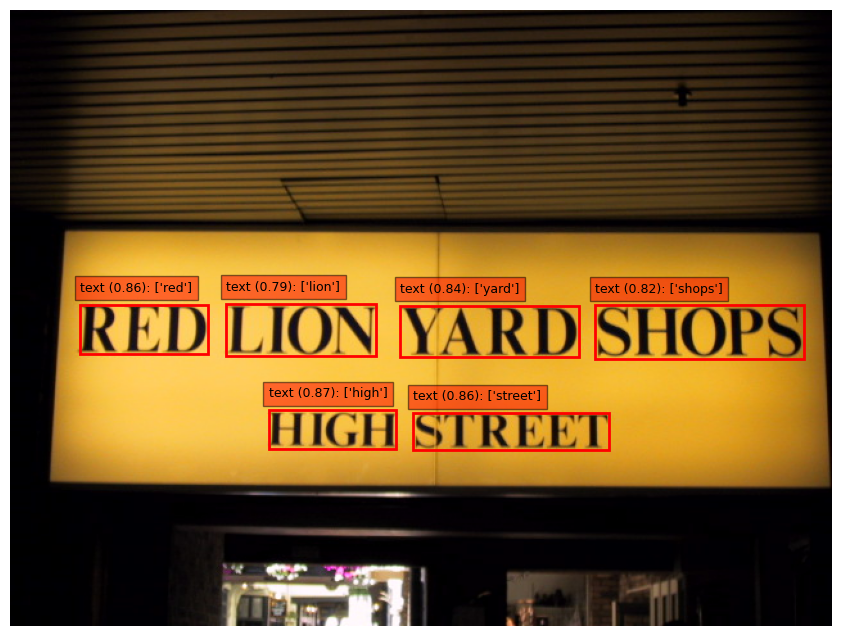

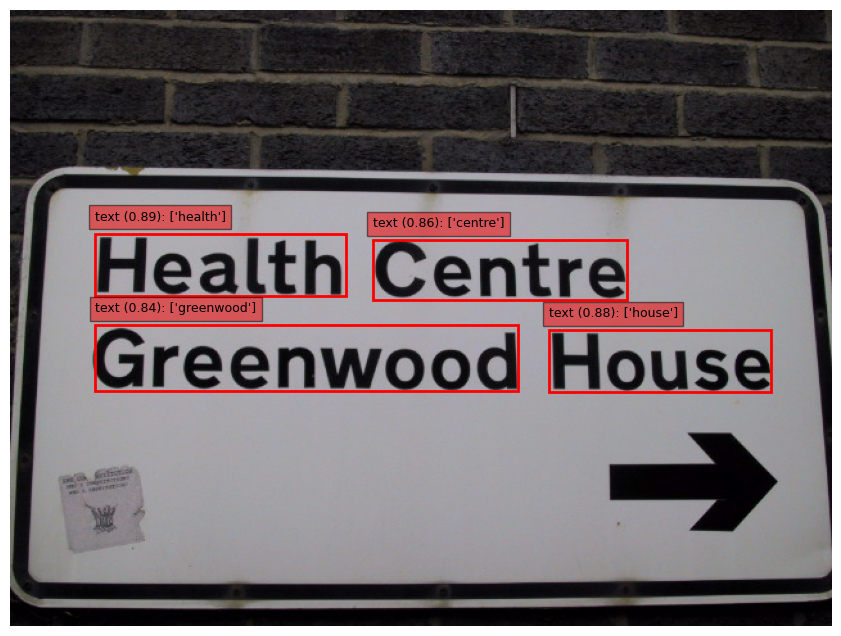

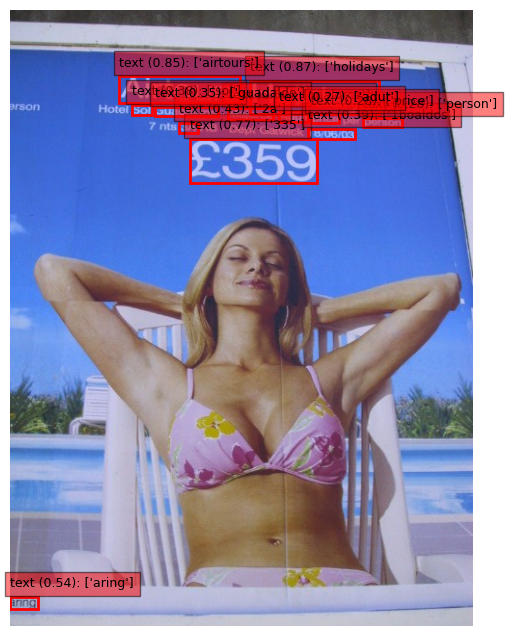

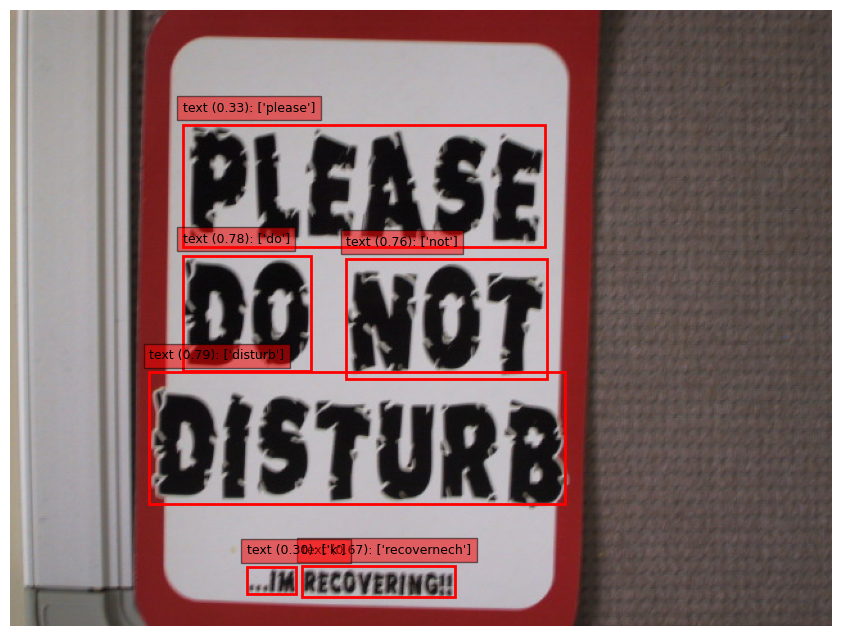

...

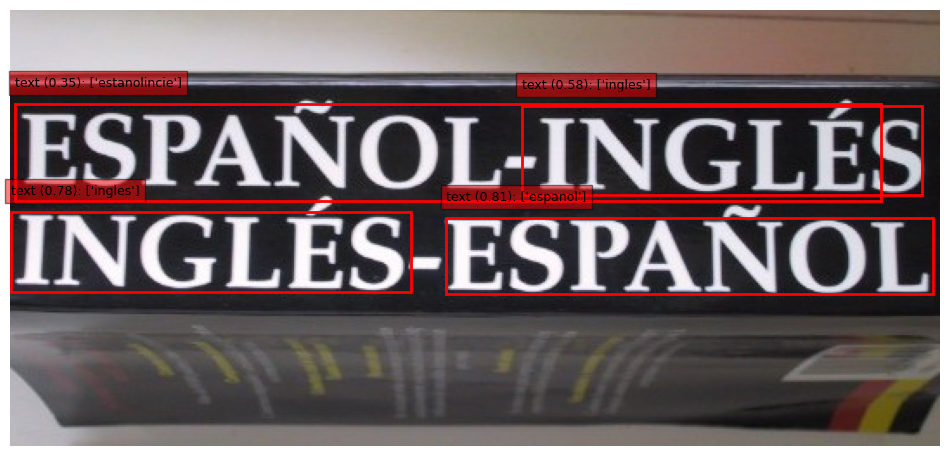

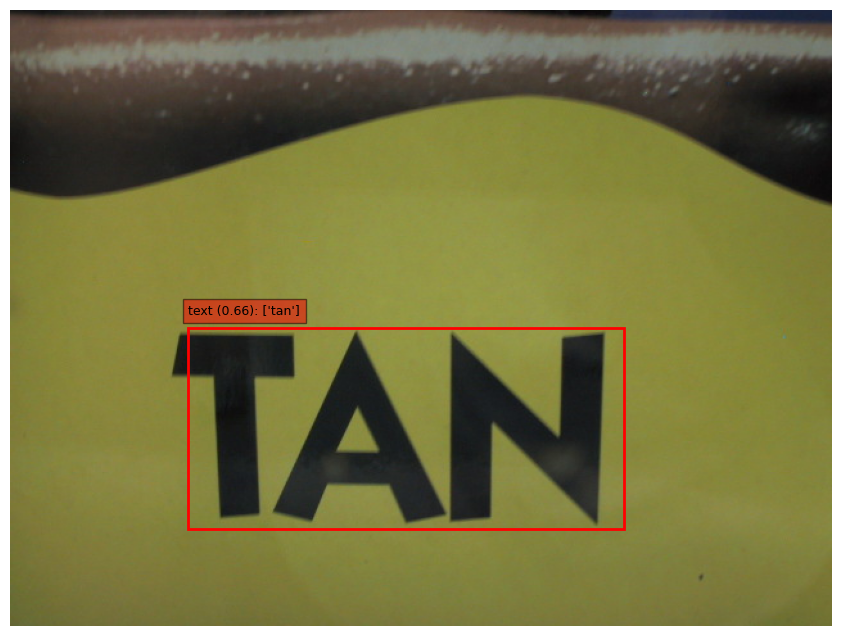

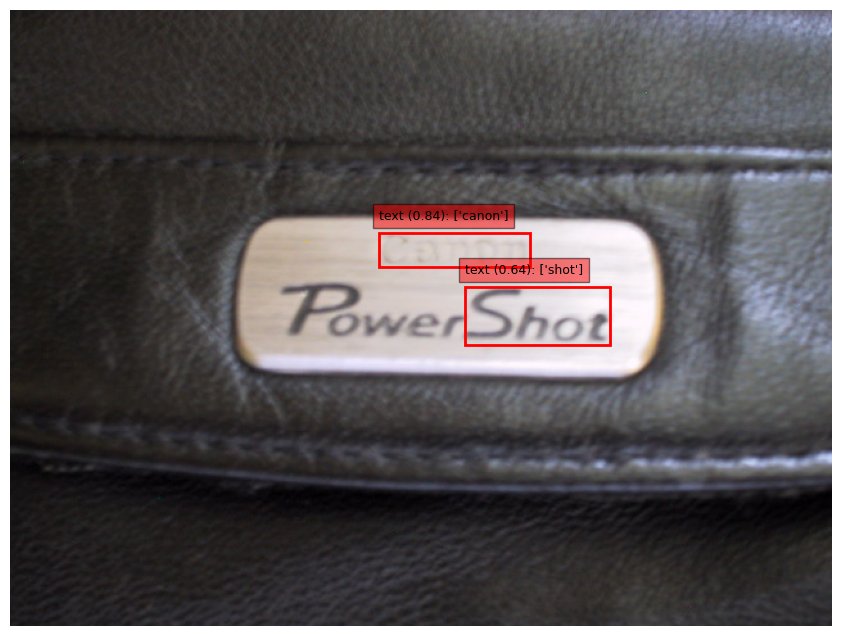

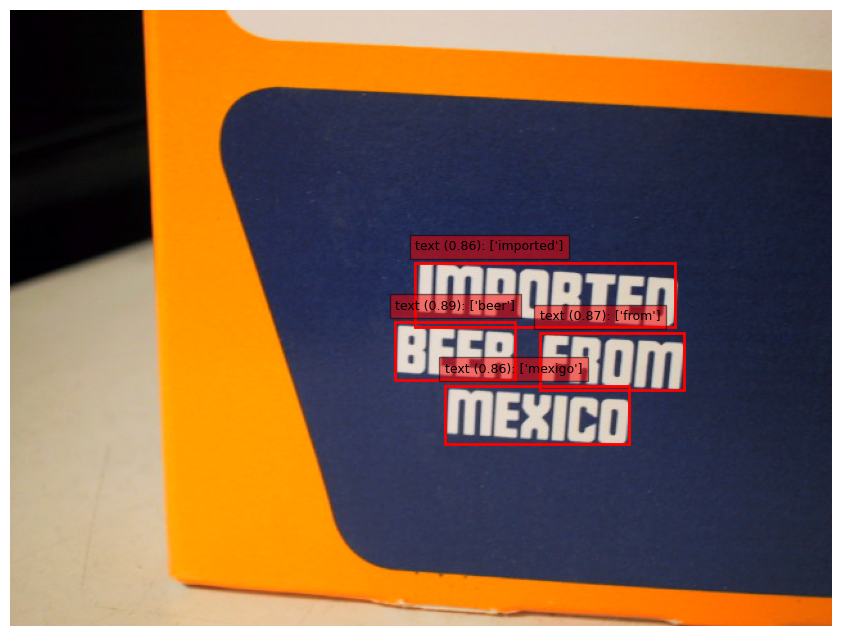

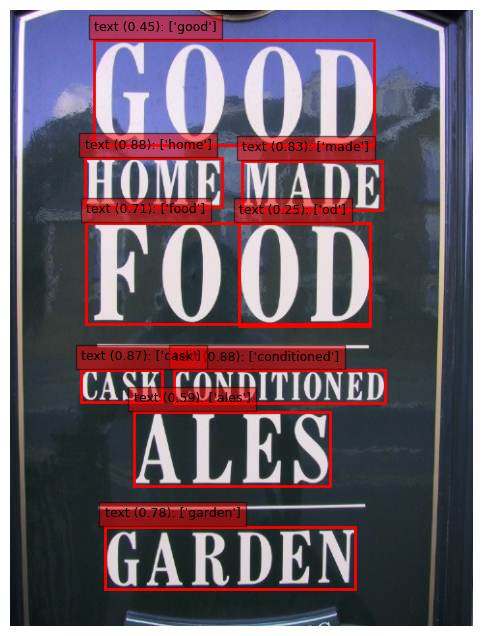

In [20]:
img_dir = "SceneTrialTrain/lfsosa_12.08.2002"
inf_transforms = data_transforms["val"]

for idx, img_filename in enumerate(os.listdir(img_dir)):
    img_path = os.path.join(img_dir, img_filename)
    predictions = predict(
        img_path,
        data_transforms=inf_transforms,
        text_det_model=yolo,
        text_reg_model=crnn_model,
        idx_to_char=idx_to_char,
        device=device,
    )

    if idx == 10:
        break